In [15]:
import numpy as np
import math
from scipy.integrate import quad
import statistics
from scipy import integrate
import random

######################            UCI data           ##################
data = np.genfromtxt(r'C:\Users\Kook\Desktop\SVM_Uncertain_2\data\heart.dat',
                      skip_header=18,
                      skip_footer=0,
                      names=None,
                      dtype=float,
                      delimiter=',')

x = data[:, :-1]
t = data[:, -1]
t[t == 2] = -1

import numpy as np
import pandas as pd
import time
import os

'''
                            nosie corrupted [OPTIONAL]
'''
import noiseADD as na
#x = na.withnoise(x, r=0.05)
#x = na.withnoise(x, r=0.1)



from sklearn.preprocessing import StandardScaler
x = StandardScaler().fit_transform(x)





from s_SVM_Hingeloss import SVM_Hinge_sgd_2
from s_SVM_insensitive import SVM_Insensitive_BFGS_2
from s_SVM_generalized_pinball import SVM_GP_sgd_2

from t_SVM_Hingeloss import SVM_Hinge_sgd_3

from RBF_s_SVM_Hingeloss import RBF_SVM_Hinge_sgd_2
from RBF_s_SVM_generalized_pinball import RBF_SVM_GP_sgd_2
from RBF_s_SVM_insensitive import RBF_SVM_Insensitive_BFGS_2

'''
                            10-fold cross validation
'''
from sklearn.model_selection import KFold
n_folds = 10
cv = KFold(n_splits=n_folds, shuffle=True, random_state=58310798)

acc_train = np.empty((n_folds))
acc_test = np.empty((n_folds))
processingtime = np.empty((n_folds))
conf_M_train = np.empty((n_folds,2,2))
conf_M_test = np.empty((n_folds,2,2))
print('#'*75)
      



df_obj_hinge = pd.DataFrame(columns=["fold1", "fold2","fold3","fold4","fold5","fold6", "fold7","fold8","fold9","fold10"])
df_time_hinge = pd.DataFrame(columns=["fold1", "fold2","fold3","fold4","fold5","fold6", "fold7","fold8","fold9","fold10"])

x

###########################################################################


array([[ 1.71209356,  0.6894997 ,  0.87092765, ...,  0.67641928,
         2.47268219, -0.87570581],
       [ 1.38213977, -1.45032695, -0.18355874, ...,  0.67641928,
        -0.71153494,  1.18927733],
       [ 0.2822938 ,  0.6894997 , -1.23804513, ..., -0.95423434,
        -0.71153494,  1.18927733],
       ...,
       [ 0.1723092 , -1.45032695, -1.23804513, ...,  0.67641928,
        -0.71153494, -0.87570581],
       [ 0.2822938 ,  0.6894997 ,  0.87092765, ...,  0.67641928,
        -0.71153494,  0.67303154],
       [ 1.38213977,  0.6894997 ,  0.87092765, ...,  0.67641928,
         2.47268219, -0.87570581]])

In [16]:
##### setting hyperparameter
max_epochs_ = 50
n_batches_ = 64

In [17]:
import time
from sklearn.metrics import accuracy_score, confusion_matrix


''' Testing Cross Validation '''
'''
                            Testing with SVM_Hingeloss
'''
print("Using SVM_Hingeloss")
#start Cross Validation
for i, (train, test) in enumerate(cv.split(x)):
    
    #choose model     
    #model = SVM_Hinge_sgd_3(max_epochs = 100, n_batches = 64, C=0.125)
    model = RBF_SVM_Hinge_sgd_2(max_epochs = max_epochs_, n_batches = n_batches_, C= 0.0625)
    
    #steamp time
    start = time.time()
    #modeling
    model.fit(x[train], t[train])
    #cpu time used
    processingtime[i] = time.time() - start
    
    #prediction
    y_train = model.predict(x[train])
    y_test = model.predict(x[test])
     
    #evaluation model
    acc_train[i]= accuracy_score(t[train], y_train)
    acc_test[i] = accuracy_score(t[test], y_test)
    conf_M_train[i] = confusion_matrix(t[train], y_train)
    conf_M_test[i] = confusion_matrix(t[test], y_test)

    # setup dataframe
    obj_func = model.obj_func
    this_column = df_obj_hinge.columns[i]
    df_obj_hinge[this_column] = obj_func

#display result
#df_itersgdh = pd.DataFrame(model.iter_batchsgd)
print('CPU time = %.4f and its S.D. = %.4f' % (np.mean(processingtime), np.std(processingtime)))
print("Training accuracy = %.4f and its S.D. = %.4f" % (np.mean(acc_train), np.std(acc_train)))
print('Training confusion matirx: \n', np.mean(conf_M_train, axis=0))
print("Test accuracy     = %.4f and its S.D. = %.4f" % (np.mean(acc_test), np.std(acc_test)))
print('Test confusion matirx: \n', np.mean(conf_M_test, axis=0))
print('#'*75)

Using SVM_Hingeloss
Epoch: 1 [200 147 221  94 219  54 152  88 126  90  80 197 192 100   5  11  66 109
 238  61  91 117 236 141  21  55 227 120 130   7 214 181  86 169 206 148
 184 113 121  25  63 119 160  14  62  85  79  49  84  20 232 163 149 229
 128 241  67  37  31 212 198 151 104 162  87 230  53  68 193 125  52   1
  93 138 218 208  16  43 101 161 103  89 139 178 194  45  41 164  10 182
 156 122 180  47 170   3  77  69  35  33 234  75 135  26  28  59  19 174
 131  92  13 207 240 202  82 108 146 209 179 216 136  56  40   8 134  71
 111 205  51 217  64 165 223 195  39 186 106 187 153 228 144 159  30 226
 204  73 239 201  58 172  38 185   4  27 116  57   9 110 133 199   0 157
 173 183 225 171 150  23  81 127 213  98 177 176 137 132  36 118  72 242
  24 167 114   6 222 102 168 123 224  12 211 105  18 235 220  29 129 203
 112 188 145  46  65 154 142  34  83  42  15 155 231  17 237  78  97 143
 189 140 107 175  32 190 233  22   2  48 124 191  60  96  74  76 158  70
  99  95  50 115 215 2

In [24]:
#from algorithm import SGDGPinLoss, SGDHingeLoss, RESmoreauGPinLoss, nonlinearRESmoreauGPinLoss, nonlinearSGDGPinLoss

df_obj_BFGS = pd.DataFrame(columns=["fold1", "fold2","fold3","fold4","fold5","fold6", "fold7","fold8","fold9","fold10"])
df_time_BFGS = pd.DataFrame(columns=["fold1", "fold2","fold3","fold4","fold5","fold6", "fold7","fold8","fold9","fold10"])

'''
                            Testing with SVM_BFGS
'''

print("Using SVM_BFGS")
#start Cross Validation
for i, (train, test) in enumerate(cv.split(x)):
    
    #choose model     
    #model = SVM_Insensitive_BFGS_2(max_epochs = 100, n_batches = 64, C=0.0625, tau =0.8, epsilon = 0.8 )
    model = RBF_SVM_Insensitive_BFGS_2(max_epochs = 200, n_batches = n_batches_, C=0.125, tau =0.4  , epsilon = 0.2)
    
    #steamp time
    start = time.time()
    #modeling
    model.fit(x[train], t[train])
    #cpu time used
    processingtime[i] = time.time() - start
    
    #prediction
    y_train = model.predict(x[train])
    y_test = model.predict(x[test])
     
    #evaluation model
    acc_train[i]= accuracy_score(t[train], y_train)
    acc_test[i] = accuracy_score(t[test], y_test)
    conf_M_train[i] = confusion_matrix(t[train], y_train)
    conf_M_test[i] = confusion_matrix(t[test], y_test)

    # setup dataframe
    obj_func = model.obj_func
    this_column = df_obj_BFGS.columns[i]
    df_obj_BFGS[this_column] = obj_func

#display result
#df_itersgdh = pd.DataFrame(model.iter_batchsgd)
print('CPU time = %.4f and its S.D. = %.4f' % (np.mean(processingtime), np.std(processingtime)))
print("Training accuracy = %.4f and its S.D. = %.4f" % (np.mean(acc_train), np.std(acc_train)))
print('Training confusion matirx: \n', np.mean(conf_M_train, axis=0))
print("Test accuracy     = %.4f and its S.D. = %.4f" % (np.mean(acc_test), np.std(acc_test)))
print('Test confusion matirx: \n', np.mean(conf_M_test, axis=0))
print('#'*75)

Using SVM_BFGS
----k:  1
----k:  2
----k:  3
----k:  4
----k:  5
----k:  6
----k:  7
----k:  8
----k:  9
----k:  10
----k:  11
----k:  12
----k:  13
----k:  14
----k:  15
----k:  16
----k:  17
----k:  18
----k:  19
----k:  20
----k:  21
----k:  22
----k:  23
----k:  24
----k:  25
----k:  26
----k:  27
----k:  28
----k:  29
----k:  30
----k:  31
----k:  32
----k:  33
----k:  34
----k:  35
----k:  36
----k:  37
----k:  38
----k:  39
----k:  40
----k:  41
----k:  42
----k:  43
----k:  44
----k:  45
----k:  46
----k:  47
----k:  48
----k:  49
----k:  50
----k:  51
----k:  52
----k:  53
----k:  54
----k:  55
----k:  56
----k:  57
----k:  58
----k:  59
----k:  60
----k:  61
----k:  62
----k:  63
----k:  64
----k:  65
----k:  66
----k:  67
----k:  68
----k:  69
----k:  70
----k:  71
----k:  72
----k:  73
----k:  74
----k:  75
----k:  76
----k:  77
----k:  78
----k:  79
----k:  80
----k:  81
----k:  82
----k:  83
----k:  84
----k:  85
----k:  86
----k:  87
----k:  88
----k:  89
----k:  90
----

In [19]:
df_obj_GP = pd.DataFrame(columns=["fold1", "fold2","fold3","fold4","fold5","fold6", "fold7","fold8","fold9","fold10"])
df_time_GP = pd.DataFrame(columns=["fold1", "fold2","fold3","fold4","fold5","fold6", "fold7","fold8","fold9","fold10"])


'''
                            Testing with SVM_GP
'''

print("Using SVM_GP")
#start Cross Validation
for i, (train, test) in enumerate(cv.split(x)):
    
    #choose model     
    #model = SVM_GP_sgd_2(C = 2, max_epochs = 100 , n_batches = 64, tau_1 = 0.8, tau_2 = 0.8, epsilon_1 = 1, epsilon_2 = 1)
    model = RBF_SVM_GP_sgd_2(C = 0.0625, max_epochs = max_epochs_, n_batches = n_batches_, tau_1 = 0.8, tau_2 = 0.2, epsilon_1 = 0.2, epsilon_2 = 0.2)
    
    #steamp time
    start = time.time()
    #modeling
    model.fit(x[train], t[train])
    #cpu time used
    processingtime[i] = time.time() - start
    
    #prediction
    y_train = model.predict(x[train])
    y_test = model.predict(x[test])
     
    #evaluation model
    acc_train[i]= accuracy_score(t[train], y_train)
    acc_test[i] = accuracy_score(t[test], y_test)
    conf_M_train[i] = confusion_matrix(t[train], y_train)
    conf_M_test[i] = confusion_matrix(t[test], y_test)

    # setup dataframe
    obj_func = model.obj_func
    this_column = df_obj_GP.columns[i]
    df_obj_GP[this_column] = obj_func

#df_itersgdG = pd.DataFrame(model.iter_sgdG)

#display result
print('CPU time = %.4f and its S.D. = %.4f' % (np.mean(processingtime), np.std(processingtime)))
print("Training accuracy = %.4f and its S.D. = %.4f" % (np.mean(acc_train), np.std(acc_train)))
print('Training confusion matirx: \n', np.mean(conf_M_train, axis=0))
print("Test accuracy     = %.4f and its S.D. = %.4f" % (np.mean(acc_test), np.std(acc_test)))
print('Test confusion matirx: \n', np.mean(conf_M_test, axis=0))
print('#'*75)


Using SVM_GP
Epoch: 1 [105 182  69 185 117  91 205  99 159  76  60  37  56  31   8  71  21 197
 157 215 193  96 180 120  78 107 151 226   1  23 110 116 194 212  58 235
 234 199 218 138  29 184  73 152  39 129  22  67 240 189  68  49 198  25
 146 179 174 155  79 150  24  30 112 195  44  15  82  10 242 231  40 167
   7 123 147 126 191 225  11  72 100  61 223 118  74 128 106   4 160 230
 165  38 134  70 104  46 222 188 119 108  41 217 181  57  33 145  95 232
   2 135   6 175 237 169  83   0 196  16 125 187  51  48  89  53   9  35
 156 131  20  26  75  13  85  54 209   5 201  34 238 166 178 101 127 236
 186  64 239  27 154  62 164 210  63  94  65 132  28  86 133 216 176 228
 130 233 170 168 140 158 241 207 113 172 192 149 208 136  43  93 190  80
 214 102  50 124  47  59 137 114  87  36 206 143 227 177 148 122  18 161
 141  45 109 103  98  42 203  66  90 162 153 224 183 171  55 200  12 139
 204 173  92  17  84 121  81  32 211  19 220  77 219 111  52 221 115  88
 144   3  97 213  14 142 229 

In [26]:
df_obj_hinge['mean'] = df_obj_hinge.iloc[:,1:10].mean(axis=1)
df_obj_BFGS['mean'] = df_obj_BFGS.iloc[:,1:10].mean(axis=1)
df_obj_GP['mean'] = df_obj_GP.iloc[:,1:10].mean(axis=1)
#df_objsgdG,df_objsgdh,df_objres
df_obj_hinge

,fold1,fold2,fold3,fold4,fold5,fold6,fold7,fold8,fold9,fold10,mean
0,9.140139,9.153407,9.134130,9.095005,9.094456,9.153049,9.166140,9.133162,9.132470,9.093921,9.128416
1,8.084864,8.049309,8.041269,7.992032,8.034805,8.033150,8.078328,8.048575,8.052417,7.996968,8.036317
2,7.609424,7.573719,7.557511,7.519590,7.550625,7.564202,7.589357,7.566306,7.571809,7.530182,7.558145
3,7.298878,7.276714,7.272657,7.232462,7.261979,7.278305,7.292995,7.267558,7.272481,7.246914,7.266896
4,7.077146,7.064794,7.054912,7.031702,7.045021,7.063507,7.081163,7.063613,7.064184,7.035199,7.056010
...,...,...,...,...,...,...,...,...,...,...,...
195,4.676985,4.676944,4.670147,4.662648,4.665260,4.680705,4.687247,4.679854,4.677728,4.664763,4.673922
196,4.675697,4.674564,4.667134,4.660486,4.663439,4.678232,4.684523,4.677537,4.675704,4.662641,4.671584
197,4.672222,4.672023,4.664947,4.658113,4.659758,4.676195,4.681386,4.674701,4.672762,4.660301,4.668909
198,4.670217,4.669258,4.662541,4.655045,4.657858,4.672945,4.679774,4.671987,4.671386,4.657419,4.666468


In [27]:
df_obj_BFGS

,fold1,fold2,fold3,fold4,fold5,fold6,fold7,fold8,fold9,fold10,mean
0,122.254983,122.256777,122.254703,122.251086,122.251051,122.256132,122.257133,122.254284,122.254439,122.251148,122.254084
1,0.301721,0.300437,0.299969,0.303387,0.304984,0.301306,0.299500,0.300671,0.304280,0.306732,0.302363
2,0.154255,0.153923,0.153768,0.154683,0.155130,0.154155,0.153646,0.153929,0.154981,0.155634,0.154428
3,0.124066,0.123933,0.123849,0.124225,0.124425,0.124032,0.123805,0.123902,0.124392,0.124658,0.124136
4,0.113495,0.113430,0.113372,0.113559,0.113673,0.113483,0.113357,0.113390,0.113679,0.113808,0.113528
...,...,...,...,...,...,...,...,...,...,...,...
195,0.099883,0.099896,0.099882,0.099821,0.099822,0.099898,0.099909,0.099870,0.099871,0.099822,0.099866
196,0.099883,0.099896,0.099882,0.099821,0.099822,0.099898,0.099909,0.099870,0.099871,0.099822,0.099866
197,0.099883,0.099896,0.099882,0.099821,0.099822,0.099898,0.099909,0.099870,0.099871,0.099822,0.099866
198,0.099883,0.099896,0.099882,0.099821,0.099822,0.099898,0.099909,0.099870,0.099871,0.099822,0.099866


In [28]:
df_obj_GP

,fold1,fold2,fold3,fold4,fold5,fold6,fold7,fold8,fold9,fold10,mean
0,122.114511,122.115163,122.114317,122.112811,122.112814,122.115039,122.115594,122.114208,122.114321,122.112686,122.114106
1,0.038010,0.037884,0.037961,0.037955,0.037803,0.037863,0.037964,0.037859,0.037904,0.038080,0.037919
2,0.037632,0.037597,0.037554,0.037611,0.037617,0.037603,0.037592,0.037529,0.037572,0.037549,0.037580
3,0.037511,0.037516,0.037504,0.037519,0.037517,0.037522,0.037528,0.037507,0.037528,0.037516,0.037517
4,0.037512,0.037511,0.037517,0.037526,0.037540,0.037513,0.037511,0.037522,0.037535,0.037487,0.037518
...,...,...,...,...,...,...,...,...,...,...,...
195,0.037480,0.037482,0.037480,0.037470,0.037470,0.037483,0.037485,0.037478,0.037478,0.037470,0.037477
196,0.037480,0.037482,0.037480,0.037470,0.037470,0.037483,0.037485,0.037478,0.037478,0.037470,0.037477
197,0.037480,0.037482,0.037480,0.037470,0.037470,0.037483,0.037485,0.037478,0.037478,0.037470,0.037477
198,0.037480,0.037482,0.037480,0.037470,0.037470,0.037483,0.037485,0.037478,0.037478,0.037470,0.037477


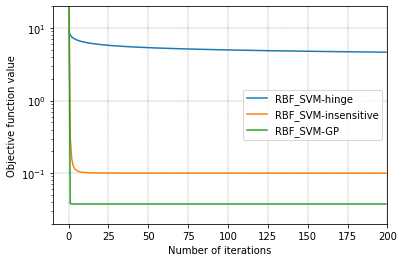

In [37]:
'''plot graph combine 3 algs'''

import os
import matplotlib.pyplot as plt


ac = plt.gca()


df_obj_hinge.plot(kind='line', y='mean',  
                  ax=ac)
df_obj_BFGS.plot(kind='line', y='mean',  
                   ax=ac)
df_obj_GP.plot(kind='line', y='mean',  
                   ax=ac)                  


plt.yscale("log")
#plt.xscale("log")
plt.xlabel('Number of iterations')
plt.ylabel('Objective function value')
#plt.legend(['(a)','(b)','(c)','(d)'],prop={'size':10})
#plt.legend([r'SVM-hinge ',r'SVM-insensitive',r'SVM-GP'],prop={'size':10})
plt.legend([r'RBF_SVM-hinge ',r'RBF_SVM-insensitive',r'RBF_SVM-GP'],prop={'size':10})
plt.grid(which='major', linestyle='--', linewidth='0.2', color='black')
#plt.ylim(1e-1, 1e3)
plt.ylim(0.02, 20)
plt.xlim(-10, 200)
#plt.figure(figsize=(10, 3))

#plt.savefig("/Users/dawraweemakmuang/Desktop/my_work2/pic/twonorm" +".pdf", format="PDF")  
plt.show()
